# FB Prophet (Time Series Forecasting)

In [1]:
!pip install prophet

In [2]:
import pandas as pd
from prophet.plot import plot_plotly,plot_components_plotly
from prophet import Prophet

In [3]:
# import csv dataset
df=pd.read_csv('divvy-tripdata_cleaned.csv')

# drop the na values
df.dropna(inplace=True)
df.reset_index(drop=True,inplace=True)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47086 entries, 0 to 47085
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   trip_id            47086 non-null  int64  
 1   start_time         47086 non-null  object 
 2   stop_time          47086 non-null  object 
 3   bike_id            47086 non-null  int64  
 4   trip_duration      47086 non-null  int64  
 5   from_station_id    47086 non-null  int64  
 6   from_station_name  47086 non-null  object 
 7   to_station_id      47086 non-null  int64  
 8   to_station_name    47086 non-null  object 
 9   user_type          47086 non-null  object 
 10  gender             47086 non-null  object 
 11  birth_year         47086 non-null  float64
 12  from_latitude      47086 non-null  float64
 13  from_longitude     47086 non-null  float64
 14  from_location      47086 non-null  object 
 15  to_latitude        47086 non-null  float64
 16  to_longitude       470

In [5]:
df.head()

,trip_id,start_time,stop_time,bike_id,trip_duration,from_station_id,from_station_name,to_station_id,to_station_name,user_type,...,from_longitude,from_location,to_latitude,to_longitude,to_location,date,year,month,day,day_of_week
0,2578617,07/14/2014 05:17:00 PM,07/14/2014 05:21:00 PM,559,277,98,LaSalle St & Washington St,192,Canal St & Adams St,Subscriber,...,-87.632530,POINT (-87.63253 41.882664),41.879255,-87.639904,POINT (-87.639904 41.879255),2014-07-14,2014,7,14,Monday
1,2178869,06/19/2014 06:04:00 PM,06/19/2014 06:13:00 PM,2318,566,58,Marshfield Ave & Cortland St,224,Halsted St & Willow St,Subscriber,...,-87.668879,POINT (-87.668879 41.916017),41.913778,-87.648840,POINT (-87.64884 41.913778),2014-06-19,2014,6,19,Thursday
2,2504249,07/09/2014 07:46:00 PM,07/09/2014 07:56:00 PM,359,637,229,Southport Ave & Roscoe St,340,Clark St & Wrightwood Ave,Subscriber,...,-87.664020,POINT (-87.66402 41.943739),41.929546,-87.643118,POINT (-87.643118 41.929546),2014-07-09,2014,7,9,Wednesday
3,2298053,06/27/2014 04:19:00 PM,06/27/2014 04:21:00 PM,802,161,118,Sedgwick St & North Ave,291,Wells St & Evergreen Ave,Subscriber,...,-87.638677,POINT (-87.638677 41.911386),41.906724,-87.634830,POINT (-87.63483 41.906724),2014-06-27,2014,6,27,Friday
4,1205964,02/26/2014 07:28:00 PM,02/26/2014 07:31:00 PM,986,210,286,Franklin St & Quincy St,33,State St & Van Buren St,Subscriber,...,-87.634793,POINT (-87.634793 41.878724),41.877181,-87.627844,POINT (-87.627844 41.877181),2014-02-26,2014,2,26,Wednesday


In [6]:
df=df[["start_time","trip_duration"]]
df.head()

,start_time,trip_duration
0,07/14/2014 05:17:00 PM,277
1,06/19/2014 06:04:00 PM,566
2,07/09/2014 07:46:00 PM,637
3,06/27/2014 04:19:00 PM,161
4,02/26/2014 07:28:00 PM,210


Change Column Names for FB Prophet

In [7]:
df.columns=['ds','y']

In [8]:
df['ds']=pd.to_datetime(df['ds'])
df=df.sort_values("ds")
df.tail()

,ds,y
19912,2014-07-27 19:07:00,665
25598,2014-07-27 19:17:00,183
148,2014-07-27 19:18:00,1150
42319,2014-07-27 19:19:00,951
3231,2015-12-31 17:35:00,521


<AxesSubplot:xlabel='ds'>

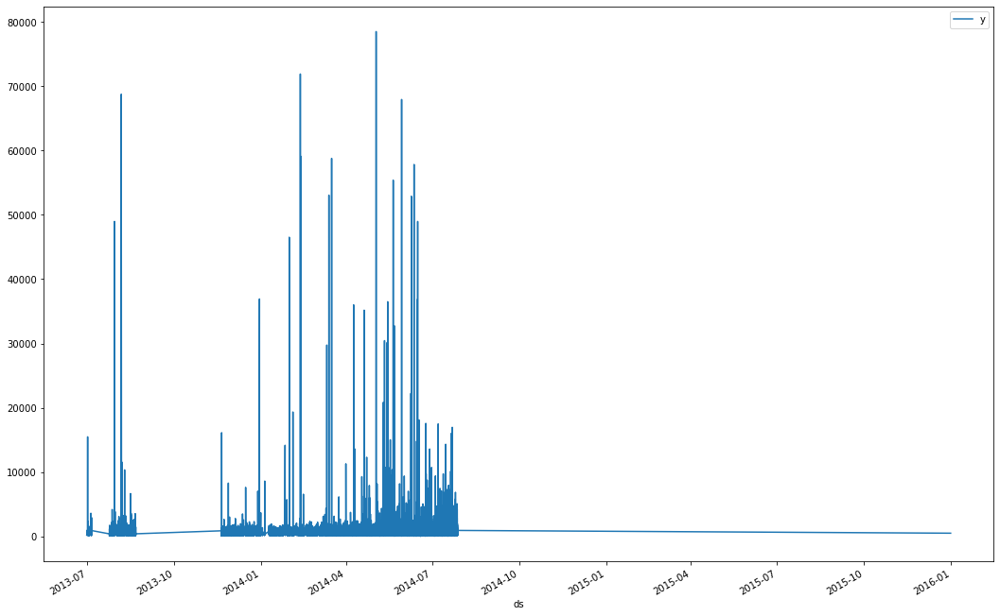

In [9]:
# plot the dataset
df.plot(x='ds',y='y',figsize=(18,12))

In [10]:
# printing the length of the dataset
len(df)

47086

Train, Test Split

In [11]:
train=df.iloc[:len(df)-472]
test=df.iloc[len(df)-472:]

Start Making Predictions

In [12]:
m=Prophet()
m.fit(train)
# making daily predictions
future=m.make_future_dataframe(periods=207,freq="D")
forecast=m.predict(future)

11:15:54 - cmdstanpy - INFO - Chain [1] start processing
11:16:02 - cmdstanpy - INFO - Chain [1] done processing


In [13]:
forecast.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
39588,2015-02-14 13:10:00,849.717445,-772.856619,2649.070144,345.344488,1314.696016,37.073657,37.073657,37.073657,-33.361508,-33.361508,-33.361508,70.435166,70.435166,70.435166,0.0,0.0,0.0,886.791103
39589,2015-02-15 13:10:00,850.094168,-682.502113,2521.094900,342.548777,1319.605957,57.478614,57.478614,57.478614,-33.361508,-33.361508,-33.361508,90.840122,90.840122,90.840122,0.0,0.0,0.0,907.572781
39590,2015-02-16 13:10:00,850.470890,-1063.819168,2548.447866,340.716585,1324.169170,-56.261059,-56.261059,-56.261059,-33.361508,-33.361508,-33.361508,-22.899551,-22.899551,-22.899551,0.0,0.0,0.0,794.209831
39591,2015-02-17 13:10:00,850.847612,-857.562588,2559.903890,335.707763,1328.432882,-52.470053,-52.470053,-52.470053,-33.361508,-33.361508,-33.361508,-19.108545,-19.108545,-19.108545,0.0,0.0,0.0,798.377558
39592,2015-02-18 13:10:00,851.224334,-1019.922609,2341.517444,329.499428,1332.747576,-77.659031,-77.659031,-77.659031,-33.361508,-33.361508,-33.361508,-44.297522,-44.297522,-44.297522,0.0,0.0,0.0,773.565303


In [14]:
forecast[['ds','yhat','yhat_lower','yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
39588,2015-02-14 13:10:00,886.791103,-772.856619,2649.070144
39589,2015-02-15 13:10:00,907.572781,-682.502113,2521.094900
39590,2015-02-16 13:10:00,794.209831,-1063.819168,2548.447866
39591,2015-02-17 13:10:00,798.377558,-857.562588,2559.903890
39592,2015-02-18 13:10:00,773.565303,-1019.922609,2341.517444


In [15]:
test.tail()

,ds,y
19912,2014-07-27 19:07:00,665
25598,2014-07-27 19:17:00,183
148,2014-07-27 19:18:00,1150
42319,2014-07-27 19:19:00,951
3231,2015-12-31 17:35:00,521


USING BUILT-IN FB PROPHET VISUALIZATION

In [16]:
plot_plotly(m,forecast)

In [17]:
plot_components_plotly(m,forecast)

Evaluating the Model

In [ ]:
from statsmodels.tools.eval_measures import rmse

In [ ]:
predictions=forecast.iloc[-472:]['yhat']